## Warsztaty Badawcze XIC
### PD 3
#### Adrian Kamiński

### Przygotowanie środowiska

In [ ]:
!pip install scikit-image -U
!pip install shap captum torchinfo
!pip install kaggle

In [2]:
import torch
import torchvision
import torchinfo
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import shap
import captum
import numpy as np
import PIL
import matplotlib.pyplot as plt

In [3]:
device = "cuda:0" if torch.cuda.is_available() else 'cpu'

In [4]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [5]:
!mkdir ~/.kaggle
!cp -av /content/gdrive/MyDrive/kaggle/kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json

'/content/gdrive/MyDrive/kaggle/kaggle.json' -> '/root/.kaggle/kaggle.json'


#### Pobieramy zbiór `Intel Image Classification` z [kaggle](https://www.kaggle.com/datasets/puneet6060/intel-image-classification)




In [6]:
!kaggle datasets download puneet6060/intel-image-classification

 95% 328M/346M [00:01<00:00, 244MB/s]
100% 346M/346M [00:01<00:00, 237MB/s]


In [ ]:
!unzip /content/intel-image-classification.zip

In [8]:
transformations = torchvision.transforms.Compose([
    torchvision.transforms.Resize((150, 150)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

invTransformations = torchvision.transforms.Compose([
    torchvision.transforms.Resize((150, 150)),
    torchvision.transforms.Normalize(mean=[0., 0., 0.], std=[ 1/0.229, 1/0.224, 1/0.225 ]),
    torchvision.transforms.Normalize(mean=[-0.485, -0.456, -0.406 ],
    std = [ 1., 1., 1. ])
])

#### I odpowiednio wczytujemy nasze dane (struktura root/train/label/*.jpg)
- wyciągamy labele oraz zdjęcia jako 3-wymiarowe tablice

In [9]:
train_set = torchvision.datasets.ImageFolder("seg_train/seg_train/", transform = transformations)
test_set = torchvision.datasets.ImageFolder("seg_test/seg_test/", transform = transformations)

In [10]:
np.random.seed(1234)
indices = np.random.choice(range(14034), size=7000, replace=False)
train_subset = torch.utils.data.Subset(train_set, indices)
# train_subset = train_set

In [11]:
train_loader = torch.utils.data.DataLoader(train_subset, batch_size=128, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=128, shuffle=True)

In [12]:
train_set

Dataset ImageFolder
    Number of datapoints: 14034
    Root location: seg_train/seg_train/
    StandardTransform
Transform: Compose(
               Resize(size=(150, 150), interpolation=bilinear, max_size=None, antialias=None)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

In [13]:
test_set

Dataset ImageFolder
    Number of datapoints: 3000
    Root location: seg_test/seg_test/
    StandardTransform
Transform: Compose(
               Resize(size=(150, 150), interpolation=bilinear, max_size=None, antialias=None)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

Widzimy, że mamy:
- 14034 zdjęć w zbiorze treningowym (skorzystamy z 7000),
- 3000 zdjęć w zbiorze testowy.

Oraz możemy sprawdzić, że wszystkie te zdjęcia mają wymiar 150x150.

Naszym zadaniem jest klasyfikacja zdjęcia do jednej z 6 klas:
- buildings
- forest
- glacier
- mountain
- sea
- street


### Sprawdzamy czy mamy zrównoważone klasy (zarówno w zbiore testowym jak i treningowym)

In [14]:
import os
CLASSES = os.listdir('./seg_train/seg_train')
CLASSES.sort()

In [15]:
CLASSES = np.array(CLASSES)
CLASSES

array(['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street'],
      dtype='<U9')

In [16]:
labels_train = np.array([y for x, y in train_subset])
unique_train, counts_train = np.unique(labels_train, return_counts=True)

labels_test = np.array([y for x, y in test_set])
unique_test, counts_test = np.unique(labels_test, return_counts=True)

print('Train')
print(np.asarray((unique_train, counts_train)).T)
print('Test')
print(np.asarray((unique_test, counts_test)).T)

Train
[[   0 1117]
 [   1 1085]
 [   2 1197]
 [   3 1254]
 [   4 1153]
 [   5 1194]]
Test
[[  0 437]
 [  1 474]
 [  2 553]
 [  3 525]
 [  4 510]
 [  5 501]]


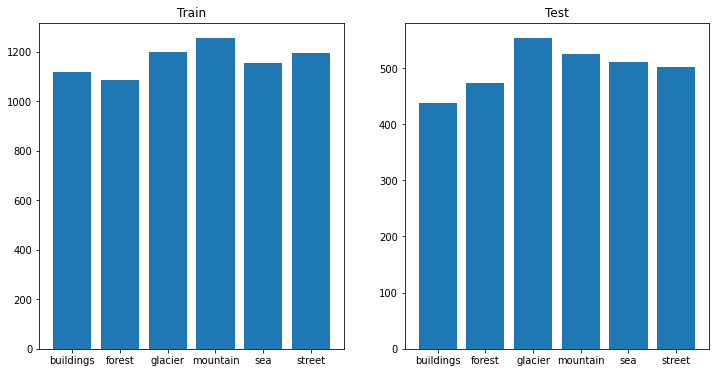

In [17]:
fig, axs = plt.subplots(1,2, figsize=(12,6))
axs[0].bar(CLASSES[unique_train],counts_train)
axs[1].bar(CLASSES[unique_test],counts_test)

axs[0].set_title('Train')
axs[1].set_title('Test')

plt.show()

#### Sprawdzamy czy udało się skutecznie wczytać nasz zbiór

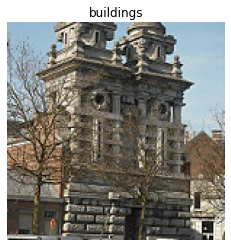

In [18]:
plt.imshow(invTransformations(train_set[1000][0]).permute(1, 2, 0))
plt.title(CLASSES[train_set[1000][1]])
plt.axis('off')
plt.show()

### Importujemy wytrenowany model `ResNet 50`

In [212]:
resnet50 = torchvision.models.resnet50(pretrained=True)

In [ ]:
resnet50.eval()

#### Wprowadzamy małe modyfikacje do architektury naszej sieci:
- Mamy na wyjściu 1000 wartości
  - Nakładamy na nie funkcję aktywacji (ReLU)
  - Następnie dokładamy warstwę Linear która będzie miała na wyściu 6 wartości (tyle ile mamy klas)
  - I na te 6 wyjść nakładamy softmax, aby na wyjściu otrzymywać prawdopodobieństwa należenia obserwacji do danej klasy

In [213]:
class NetWrapper(torch.nn.Module):
    def __init__(self, model, num_classes):
        super(NetWrapper, self).__init__()
        self.model = model
        self.flatten = nn.Flatten()
        self.linear0 = nn.Linear(1000, 128)
        self.dropout = nn.Dropout(p=0.5)
        self.ReLU = nn.ReLU()
        self.linear = nn.Linear(128, num_classes)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.model(x)
        x = self.flatten(x)
        x = self.linear0(x)
        x = self.ReLU(x)
        x = self.dropout(x)
        x = self.linear(x)
        x = self.softmax(x)
        return x

In [214]:
network = NetWrapper(resnet50, CLASSES.size).to(device) # CLASSES.size = 6

### Do uczymy nasz zbiór na pobranych przez nas danych

In [ ]:
epochs = 10
lr = 0.0001

In [ ]:
losses = []
errors_train = []
errors_test = []

optimizer = optim.RMSprop(network.parameters(), lr = lr)

for epoch in range(epochs):
    losses_iter = []
    errors_train_iter = []
    errors_test_iter = []
    correct_test = 0
    correct_train = 0

    network.eval()
    for batch in train_loader:
        images = batch[0].to(device)
        labels = batch[1].to(device).detach().cpu().numpy()

        preds = network(images).detach().cpu().numpy()
        
        # errors_train_iter += [(labels != preds.argmax(1)).detach().cpu().numpy().mean()]
        correct_train += np.sum(preds.argmax(1) == labels)

    for batch in test_loader:
        images = batch[0].to(device)
        labels = batch[1].to(device).detach().cpu().numpy()

        preds = network(images).detach().cpu().numpy()
        # errors_test_iter += [(labels != preds.argmax(1)).float().mean().item().detach().cpu().numpy()]
        correct_test += np.sum(preds.argmax(1) == labels)
    network.train()
    for batch in train_loader:

        images = batch[0].to(device)
        labels = batch[1].to(device)
        preds = network(images)
        loss = F.cross_entropy(preds, labels)

        losses_iter += [loss.detach().cpu().numpy()]

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    print(f"Epoch: {epoch+1:5d}. ", end='')
    print('Loss: ' + f"{np.mean(losses_iter)}")
    print(' '*14+'Error train: ' + f"{correct_train/len(train_subset)}")
    print(' '*14+'Error test: ' + f"{correct_test/len(test_set)}")
    losses += [np.mean(losses_iter)]
    # errors_train += [np.mean(errors_train_iter)]
    errors_train += [correct_train/len(train_subset)]
    errors_test += [correct_test/len(test_set)]

Epoch:     1. Loss: 1.2123792171478271
              Error train: 0.19457142857142856
              Error test: 0.195
Epoch:     2. Loss: 1.1298415660858154
              Error train: 0.9032857142857142
              Error test: 0.8793333333333333
Epoch:     3. Loss: 1.1187628507614136
              Error train: 0.926
              Error test: 0.9006666666666666
Epoch:     4. Loss: 1.1071405410766602
              Error train: 0.9215714285714286
              Error test: 0.8866666666666667
Epoch:     5. Loss: 1.1053118705749512
              Error train: 0.9498571428571428
              Error test: 0.915
Epoch:     6. Loss: 1.099265217781067
              Error train: 0.9355714285714286
              Error test: 0.9016666666666666
Epoch:     7. Loss: 1.092433214187622
              Error train: 0.9571428571428572
              Error test: 0.921
Epoch:     8. Loss: 1.089504361152649
              Error train: 0.9574285714285714
              Error test: 0.9156666666666666
Epoch:     9. 

In [23]:
import pandas as pd
# results = pd.DataFrame({'epoch': np.arange(1,11),
#               'loss': losses,
#               'accuracy_test': errors_test,
#               'accuracy_train': errors_train})
# results

In [24]:
# results.to_csv('./results_resnet50.csv', index=False)

In [25]:
# !cp -av './results_resnet50.csv' '/content/gdrive/My Drive/results/'
!cp -av /content/gdrive/MyDrive/colab_results/results_resnet50.csv ./

'/content/gdrive/MyDrive/colab_results/results_resnet50.csv' -> './results_resnet50.csv'


In [26]:
# torch.save(network.state_dict(), './resnet50.pth')

In [27]:
# !cp -av './resnet50.pth' '/content/gdrive/My Drive/results/'
!cp -av /content/gdrive/MyDrive/colab_results/resnet50.pth ./

'/content/gdrive/MyDrive/colab_results/resnet50.pth' -> './resnet50.pth'


In [ ]:
network.load_state_dict(torch.load('./resnet50.pth'))
network.eval()
network.to(device)

In [29]:
results = pd.read_csv('./results_resnet50.csv')
results

,epoch,loss,accuracy_test,accuracy_train
0,1,1.212379,0.195000,0.194571
1,2,1.129842,0.879333,0.903286
2,3,1.118763,0.900667,0.926000
3,4,1.107141,0.886667,0.921571
4,5,1.105312,0.915000,0.949857
5,6,1.099265,0.901667,0.935571
6,7,1.092433,0.921000,0.957143
7,8,1.089504,0.915667,0.957429
8,9,1.096093,0.913333,0.959857
9,10,1.088370,0.901333,0.951429


### Funkcje

In [34]:
y_pred = []
y_true = []
x_test = []
# iterate over test data
for batch in test_loader:
    
    inputs = batch[0].to(device)
    labels = batch[1].to(device)
        
    output = network(inputs).detach().cpu().numpy() # Feed Network

    y_pred.extend(output)
    y_true.extend(labels.data.cpu().numpy())

    x_test.extend(inputs.data.cpu().numpy())
y_pred = np.array(y_pred)
y_true = np.array(y_true)
x_test = np.array(x_test)

In [545]:
import PIL
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from sklearn.metrics import confusion_matrix
import seaborn as sns

from captum.attr import Lime
from captum.attr import IntegratedGradients
from captum.attr import KernelShap

from skimage import segmentation
from skimage import filters

In [552]:
def get_mask(id, type='slic'):
    if type == 'slic':
        mask = segmentation.slic(
            torch.tensor(x_test[id]).permute(1, 2, 0).mean(axis=2), 
            n_segments=100, 
            compactness=0.1, 
            start_label=0
            )
    if type == 'quickshift':
        mask = segmentation.quickshift(
            torch.tensor(x_test[id]).permute(1, 2, 0), 
            kernel_size=14, 
            max_dist=7, 
            ratio=0.5
            )
    # if type == "watershed":
    #     mask = segmentation.watershed(
    #         torch.tensor(x_test[id]).permute(1, 2, 0).numpy(),
    #         compactness=0.3,
    #         # offset
    #     )[:,:,0]
    # if type =='threshold_niblack':
    #     mask = filters.threshold_niblack(
    #         torch.tensor(x_test[id]).permute(1, 2, 0).numpy(),
    #         window_size=15, 
    #         k=0.2)[:,:,0]

    return mask

In [369]:
def plotLearning(results):
    
    plt.figure(figsize=(10,6))

    sns.lineplot(data=results, x='epoch', y='loss', label='Loss')
    sns.lineplot(data=results, x='epoch', y='accuracy_test', label='Accuracy test')
    sns.lineplot(data=results, x='epoch', y='accuracy_train', label='Accuracy train')
    

In [370]:
def plot_confusion_matrix(y_true, y_pred, classes=CLASSES):

    # Build confusion matrix
    cf_matrix = confusion_matrix(y_true, y_pred)
    df_cm = pd.DataFrame(cf_matrix/np.sum(cf_matrix) *6, index = [i for i in classes],
                         columns = [i for i in classes])
    plt.figure(figsize = (12,7))
    sns.heatmap(df_cm, annot=True)

In [559]:
def index_of(y_pred_label, y_true_label):
    return np.where(np.logical_and(y_true == y_true_label, y_pred.argmax(1) == y_pred_label))[0]

In [588]:
def get_random_3_best_ids(pairs):
    results = []
    for pred, true in pairs:
        results = np.append(results, np.random.choice(index_of(pred, true), size=3, replace=False))
    
    return results

In [602]:
def show_images(images, y_hat, k = 3): 
    fig, ax = plt.subplots(k, k, figsize=[6 * k, 6 * k])

    preds = y_hat.max(axis=1)
    preds_idx = y_hat.argmax(axis=1)
    for i, image in enumerate(images):
        pred = preds[i].item()
        pred_idx = preds_idx[i].item()
        ax[i%k, i//k].imshow(invTransformations(torch.tensor(image)).permute(1, 2, 0))
        ax[i%k, i//k].set_title(f"{pred_idx}: {CLASSES[pred_idx]} ({round(pred, 3)})")
        ax[i%k, i//k].axis('off')

In [603]:
def get_attr_lime(id, network=network, target='true'):
    mask = get_mask(id)
    explainer_lime = Lime(network)

    if target == 'true':
        target=int(y_true[id])
    if target == 'pred':
        target=int(y_pred.argmax(1)[id])

    attr = explainer_lime.attribute(
        torch.tensor(x_test[id]).to(device).unsqueeze(0), 
        target=target, 
        n_samples=200, 
        feature_mask=torch.as_tensor(mask).to(device),
        show_progress=False
        )
    return attr

In [604]:
def get_attr_ig(id, network=network, target='true'):
    exp_ig = IntegratedGradients(network)

    if target == 'true':
        target=int(y_true[id])
    if target == 'pred':
        target=int(y_pred.argmax(1)[id])

    attr_ig = exp_ig.attribute(
        torch.tensor(x_test[id]).to(device).unsqueeze(0),
        target=target
        )
    return attr_ig

In [605]:
def get_attr_shap(id, network=network, _type='quickshift', target='true'):
    mask = get_mask(id, _type)
    exp_ks = KernelShap(network)

    if target == 'true':
        target=int(y_true[id])
    if target == 'pred':
        target=int(y_pred.argmax(1)[id])

    attr_ks = exp_ks.attribute(
        torch.tensor(x_test[id]).to(device).unsqueeze(0), 
        target=target, 
        n_samples=200, 
        feature_mask=torch.as_tensor(mask).to(device),
        show_progress=False
        )
    return attr_ks

In [606]:
def scale_attr(attr):
    x = attr[0].cpu().mean(axis=0)
    x = x * 1 / x.abs().max()
    return x

In [609]:
def show_image_mask_explanation_by_ids(ids, target='true', explanations_lime=None, explanations_ig=None, explanations_shap=None):
    fig, axs = plt.subplots(len(ids), 6, figsize=[5 * 4, 6 * len(ids)])
    if explanations_lime==None:
        explanations_lime = []
        for id in ids:
            explanations_lime.append(get_attr_lime(id, target=target))
    if explanations_ig==None:
        explanations_ig = []
        for id in ids:
            explanations_ig.append(get_attr_ig(id, target=target))
    if explanations_shap==None:
        explanations_shap = []
        for id in ids:
            explanations_shap.append(get_attr_shap(id, target=target))

    for id, lime, ig, shap, row in zip(ids, explanations_lime, explanations_ig, explanations_shap,  range(len(ids))):
        predicted = y_pred.argmax(1)[id]
        axs[row][0].imshow(invTransformations(torch.tensor(x_test[id])).permute(1, 2, 0))
        axs[row][0].set_title(f"True: {CLASSES[y_true[id]]}\nPredicted: {CLASSES[predicted]}({y_pred[id][predicted]:.3})")
        axs[row][0].axis('off')
        axs[row][1].imshow(get_mask(id), cmap="flag")
        axs[row][1].set_title("segmentation mask")
        axs[row][1].axis('off')
        axs[row][2].imshow(scale_attr(lime), vmin=-1, vmax=1, cmap="RdBu")
        axs[row][2].set_title("explanation LIME")
        axs[row][2].axis('off')
        axs[row][3].imshow(scale_attr(ig), vmin=-1, vmax=1, cmap="RdBu")
        axs[row][3].set_title("explanation IG")
        axs[row][3].axis('off')
        axs[row][4].imshow(get_mask(id, 'watershed'), cmap="flag")
        axs[row][4].set_title("segmentation mask")
        axs[row][4].axis('off')
        axs[row][5].imshow(scale_attr(shap), vmin=-1, vmax=1, cmap="RdBu")
        axs[row][5].set_title("explanation SHAP")
        axs[row][5].axis('off')

    plt.show()
    

In [402]:
def get_random_5_best_ids(class_num):
    array = np.intersect1d(np.where(y_pred[:,class_num] == np.max(y_pred[:, class_num]))[0],
                           np.where(y_true==class_num)[0])
    return np.random.choice(array, size=5, replace=False)

In [482]:
def show_images(images, y_hat, original_idx, nrows=3, ncols=3): 
    figure = plt.figure(figsize=(3 * ncols, 3 * nrows))

    preds = y_hat.max(axis=1)
    preds_idx = y_hat.argmax(axis=1)
    for row in range(nrows):
        for col in range(1, ncols + 1):
            i=row * (nrows-1) + col - 1
            image = images[i]
            pred = preds[i].item()
            pred_idx = preds_idx[i].item()

            figure.add_subplot(nrows, ncols, col+ncols*row)
            plt.imshow(invTransformations(torch.tensor(image)).permute(1, 2, 0))
            plt.title(f"id {original_idx[i]}: {CLASSES[pred_idx]} ({round(pred, 3)})")
            plt.axis('off')

### Wizualizacja procesu uczenia

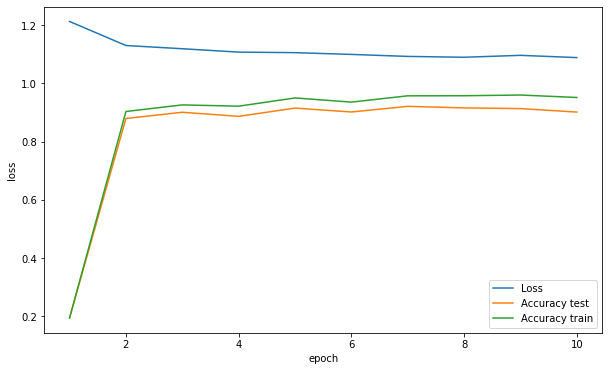

In [377]:
plotLearning(results)

#### Sprawdźmy z jaką pewnością nasz model wybiera klasy (na zbiorze testowym)

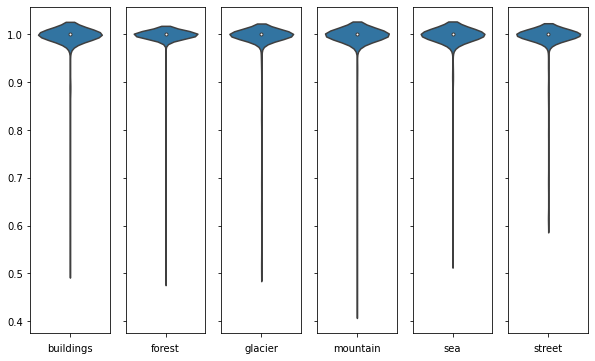

In [378]:
fig, axs = plt.subplots(1,6, sharey=True, figsize=(10,6))
for i in range(6):
    sns.violinplot(y = y_pred[y_pred.argmax(1) == i, i], ax=axs[i])
    axs[i].set_xlabel(CLASSES[i])

Widzimy, że w większości przypadków jest on na 100% pewny swojego wyboru (co jest zaskakujące).

### Wizualizacja zdjęć

In [448]:
indexes = np.array([get_random_5_best_ids(i) for i in range(len(CLASSES))]).flatten()

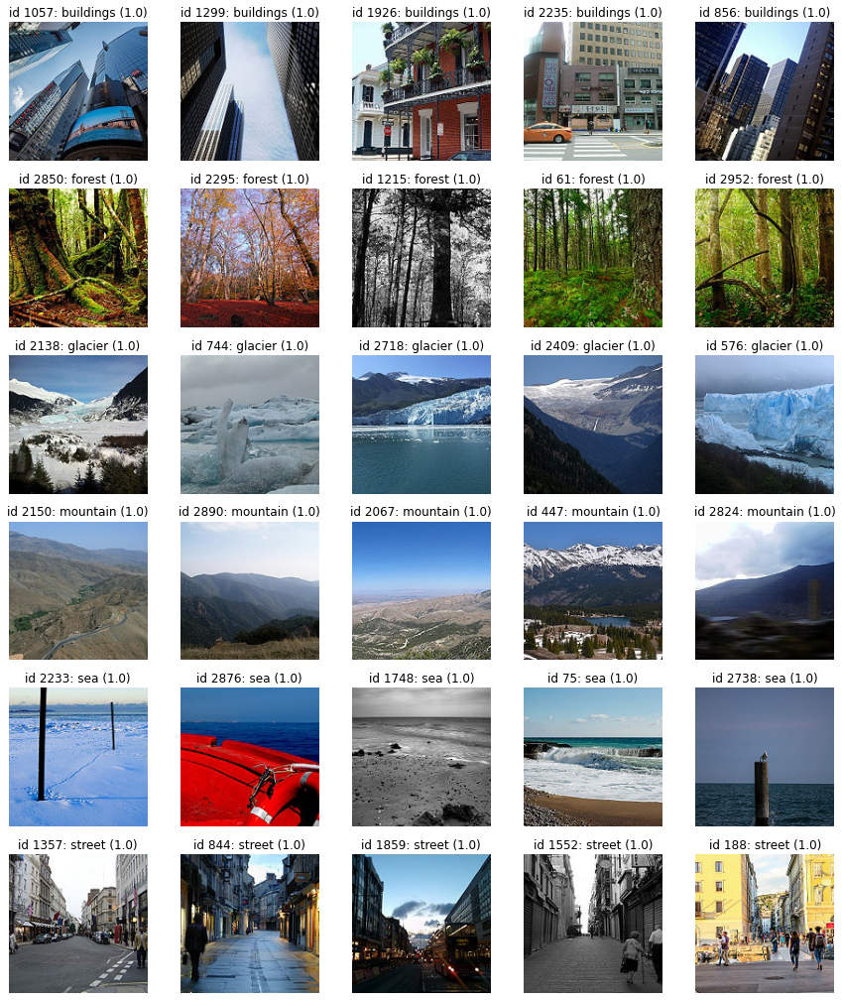

In [483]:
show_images(x_test[indexes], y_pred[indexes], indexes, 6, 5)

Wybierzemy teraz po jednym obrazku z każdej z klas. I przedziemy wyjaśniania ich.

In [514]:
selected_idx = [1926, 2952, 2718, 447, 2876, 188]

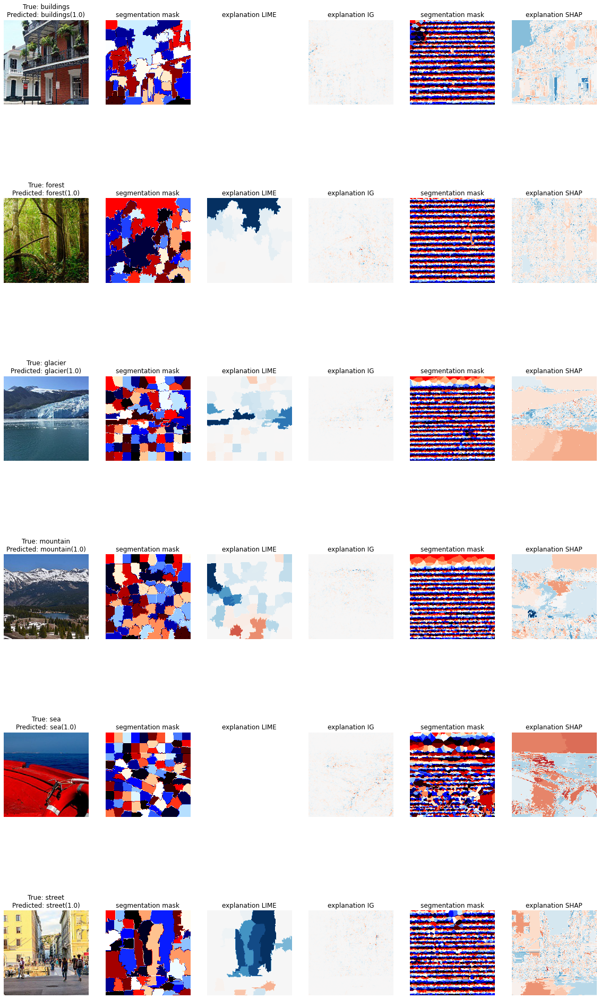

In [557]:
show_image_mask_explanation_by_ids(selected_idx)

Wartość przedstawione zostały przeskalowane aby były lepiej widoczne na wykresie.


Możemy zauważyć parę rzeczy:
- LIME często zwraca nam pusty obraz z brakiem wyjaśnień
- IG i SHAP przedstawiają kontury obrazów (nie pomaga nam to w przypadku lasu gdzie tych kontur jest wiele)
- w przypadku SHAP bardzo do wyjaśnienia brane jest niebo

### Analiza błędnie zaklasyfikowanych zdjęć

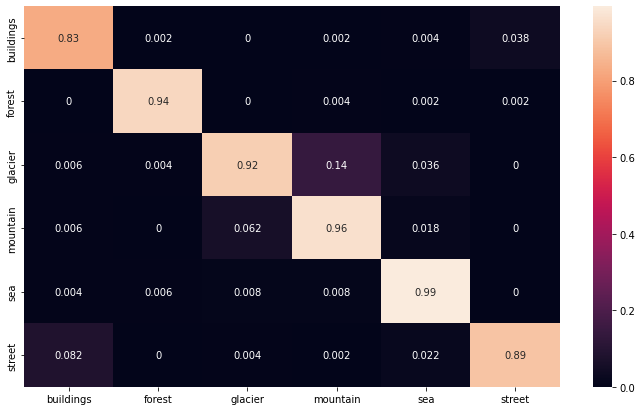

In [ ]:
plot_confusion_matrix(y_true, y_pred.argmax(1))

Sprawdzimy wyjaśnienia przy błędach które pojawiają się najczęściej
1. glacier predicted as mountain
2. mountain predicted as glacier
3. street predicted as buildings
4. buildings predicted as street 

In [594]:
indexes = get_random_3_best_ids([(3,2), (2,3), (0, 5), (5, 0)]).astype(int)

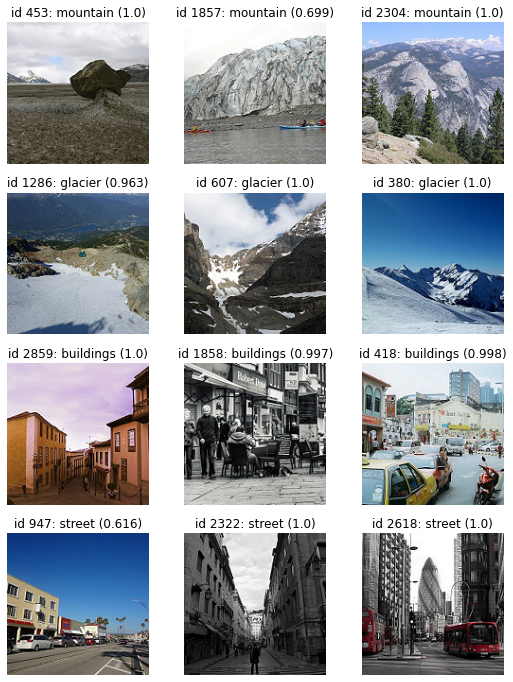

In [593]:
show_images(x_test[indexes], y_pred[indexes], indexes, 4, 3)

Widzimy, że błęd te można wybaczyć, przeważnie na zdjęciach występuje zarówno ulica jak i budynki. 

Tak samo różnice pomiędzy górą a lodowcem są niewielkie

Wyjaśnienia dla prawidłowych klas

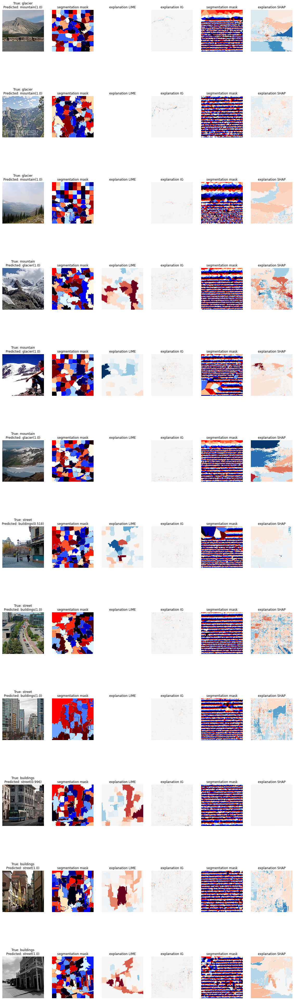

In [596]:
show_image_mask_explanation_by_ids(indexes)

Sprawdźmy jak wyglądają wyjaśnienia błędnie przewidzianych klas.

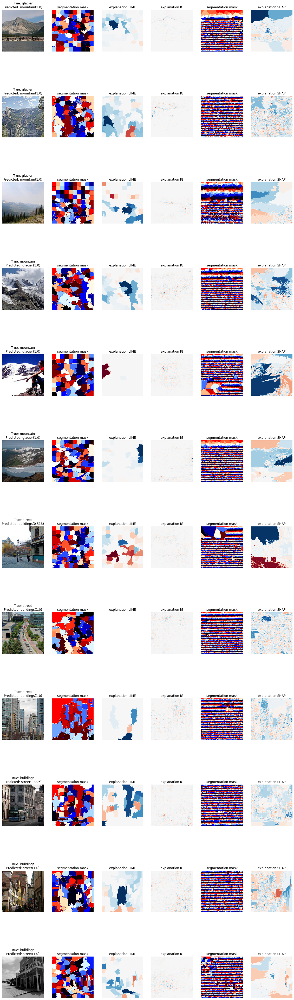

In [610]:
show_image_mask_explanation_by_ids(indexes, target='pred')

W niektórych przypadków widać, że budynki zajmują większą część zdjęcia niż ulicę i to też widać na naszym wyjaśnieniu.

W przypadku gór i lodowców widzimy podobne rysy co mogło stanowić problem dla naszego modelu. Porównianie pokazuję, że kolor nieba lub pojawienie się śniegu na zdjęciu gór powodowało błędną decyzję.